In [5]:
using FFTW
using Plots
using Random
using Statistics
using BenchmarkTools

function trimer_updates(trip)
    if trip == [0, 1, 0]
        return convert(Vector{Bool}, rand([[1, 0, 0], [0, 0, 1]]))
    elseif trip == [0, 0, 1]
        return convert(Vector{Bool}, rand([[1, 0, 0], [0, 1, 0]]))
    elseif trip == [1, 0, 0]
        return convert(Vector{Bool}, rand([[0, 0, 1], [0, 1, 0]]))
    end
    return convert(Vector{Bool},trip)
end

function trimer_updates(trip)
    if trip == [0, 1, 0]
        return convert(Vector{Bool}, rand([[1, 0, 0], [0, 0, 1]]))
    elseif trip == [0, 0, 1]
        return convert(Vector{Bool}, rand([[1, 0, 0], [0, 1, 0]]))
    elseif trip == [1, 0, 0]
        return convert(Vector{Bool}, rand([[0, 0, 1], [0, 1, 0]]))
    end
    return convert(Vector{Bool},trip)
end

function update!(state, off)
    state = circshift(collect(Iterators.flatten(map(trimer_updates, Iterators.partition(circshift(state, -off), 3)))), off)
end


l = 999999
n0 = 0.5
A = 0.1
q = 300
tmax = 100
freq = 2π * fftfreq(l)
Q = freq[q]
rho_in = n0 .+ A * cos.(Q * collect(1:l))
samples = 100


state = rand(Float64, l) .<= rho_in
a = zeros(Bool, samples, l, tmax+1)

@time begin
    for i in collect(1:samples)
        off = rand(0:2)
        a[i,:,1] = rand(Float64, l) .<= rho_in
        for t in collect(1:tmax)
            a[i,:,t+1] = update!(state, off)
        end
    end
end

 15.752289 seconds (158.87 M allocations: 11.776 GiB, 16.64% gc time, 3.72% compilation time)


In [7]:
15.752289/(l*tmax*samples)

1.5752304752304752e-7

In [3]:
plot(collect(1:l),reshape(mean(a,dims=1),(l,tmax+1))[:,1])

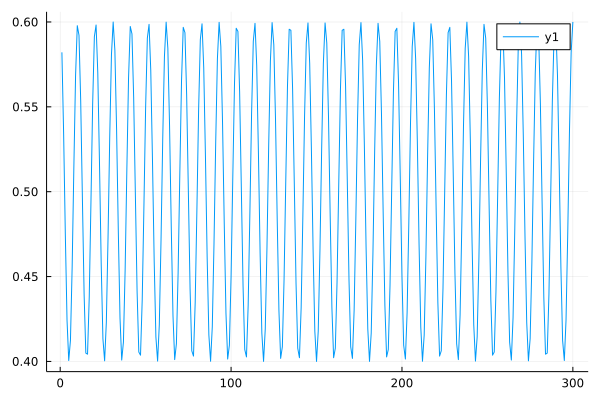

In [ ]:
plot(collect(1:l), rho_in)

In [1]:
Threads.nthreads()

1

In [17]:
ENV["JULIA_NUM_THREADS"] = "4"

"4"